In [1]:
import pandas as pd
import os
import os.path as op
import h5py
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from dtw import *
from sklearn.decomposition import PCA
from sklearn.preprocessing import RobustScaler
from scipy.stats import binned_statistic, pearsonr, linregress
from tqdm.notebook import trange, tqdm
from scipy.ndimage import gaussian_filter1d
from mne.stats import permutation_cluster_test, permutation_cluster_1samp_test, ttest_1samp_no_p
from functools import partial
from matplotlib import colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mne.io import read_epochs_eeglab

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



In [2]:
pipeline='NEARICA_behav'
ages=['9m','12m','adult']
condition_epochs={
    'exe': ['LEXT','FTGE','EXGC','EXEND'],
    'obs': ['LOBS','FTGO','OBGC','OBEND']
}

epoch_time_limits={
    'LEXT': [-1500,1000],
    'FTGE': [-500,1000],
    'EXGC': [-1000,1500],
    'EXEND': [-1500,1500],
    'LOBS': [-1500,1000],
    'FTGO': [-500,1000],
    'OBGC': [-1000,1500],
    'OBEND': [-1500,1500],
}

def load_bursts(pipeline, age):
    bursts = {
        'age': [],
        'subject': [],
        'chan': [],
        'cluster': [],
        'epoch': [],
        'fwhm_freq': [],
        'fwhm_time': [],
        'peak_adjustment': [],
        'peak_amp_base': [],
        'peak_amp_iter': [],
        'peak_freq': [],
        'peak_time': [],
        'polarity': [],
        'trial': [],
        'waveform': [],        
        'waveform_times': []
    }

    subjects=pd.read_csv(op.join('/home/bonaiuto/dev_beta_umd/data',age,'data/participants.tsv'), sep='\t')
    for subject in subjects['participant_id']:
        print('loading {}'.format(subject))
        fname=op.join('/home/bonaiuto/dev_beta_umd/data',age,'derivatives',pipeline,subject,'processed_data/processed_bursts.mat')
        if os.path.exists(fname):
            with h5py.File(fname, 'r') as f:
                bursts['age'].extend([age for x in list(f['bursts']['trial'])])
                bursts['subject'].extend([subject for x in list(f['bursts']['trial'])])
                bursts['chan'].extend(list(np.squeeze(f['bursts']['chan'][:])))
                bursts['cluster'].extend([u''.join(chr(c) for c in np.squeeze(f[obj_ref][:])) for obj_ref in np.squeeze(f['bursts']['cluster'][:])])
                bursts['epoch'].extend([u''.join(chr(c) for c in np.squeeze(f[obj_ref][:])) for obj_ref in np.squeeze(f['bursts']['epoch'][:])])
                bursts['fwhm_freq'].extend(list(np.squeeze(f['bursts']['fwhm_freq'][:])))
                bursts['fwhm_time'].extend(list(np.squeeze(f['bursts']['fwhm_time'][:])))
                bursts['peak_adjustment'].extend(list(np.squeeze(f['bursts']['peak_adjustment'][:])))
                bursts['peak_amp_base'].extend(list(np.squeeze(f['bursts']['peak_amp_base'][:])))
                bursts['peak_amp_iter'].extend(list(np.squeeze(f['bursts']['peak_amp_iter'][:])))
                bursts['peak_freq'].extend(list(np.squeeze(f['bursts']['peak_freq'][:])))
                bursts['peak_time'].extend(list(np.squeeze(f['bursts']['peak_time'][:])))
                bursts['polarity'].extend(list(np.squeeze(f['bursts']['polarity'][:])))
                bursts['trial'].extend(list(np.squeeze(f['bursts']['trial'][:])))
                for i in range(f['bursts']['waveform'][:,:].shape[1]):
                    bursts['waveform'].append(f['bursts']['waveform'][:,i])
                bursts['waveform_times']=f['bursts']['waveform_times'][:]
                
    bursts['age']=np.array(bursts['age'])
    bursts['subject']=np.array(bursts['subject'])
    bursts['chan']=np.array(bursts['chan'])
    bursts['cluster']=np.array(bursts['cluster'])
    bursts['epoch']=np.array(bursts['epoch'])
    bursts['fwhm_freq']=np.array(bursts['fwhm_freq'])
    bursts['fwhm_time']=np.array(bursts['fwhm_time'])
    bursts['peak_adjustment']=np.array(bursts['peak_adjustment'])
    bursts['peak_amp_base']=np.array(bursts['peak_amp_base'])
    bursts['peak_amp_iter']=np.array(bursts['peak_amp_iter'])
    bursts['peak_freq']=np.array(bursts['peak_freq'])
    bursts['peak_time']=np.array(bursts['peak_time'])
    bursts['polarity']=np.array(bursts['polarity'])
    bursts['trial']=np.array(bursts['trial'])
    bursts['waveform']=np.array(bursts['waveform'])
    bursts['waveform_times']=np.array(bursts['waveform_times'])
    
    return bursts

In [3]:
def combine_bursts(bursts_9m, bursts_12m, bursts_adult):
    bursts = {
        'age': [],
        'subject': [],
        'chan': [],
        'cluster': [],
        'epoch': [],
        'fwhm_freq': [],
        'fwhm_time': [],
        'peak_adjustment': [],
        'peak_amp_base': [],
        'peak_amp_iter': [],
        'peak_freq': [],
        'peak_time': [],
        'polarity': [],
        'trial': [],
        'waveform': [],        
        'waveform_times': []
    }

    for age, age_bursts in zip(['9m','12m','adult'], [bursts_9m, bursts_12m, bursts_adult]):
        bursts['age'].extend([age for x in list(age_bursts['trial'])])
        bursts['subject'].extend(['{}_{}'.format(x,age) for x in list(age_bursts['subject'])])
        bursts['chan'].extend([x for x in list(age_bursts['chan'])])
        bursts['cluster'].extend([x for x in list(age_bursts['cluster'])])
        bursts['epoch'].extend([x for x in list(age_bursts['epoch'])])
        bursts['fwhm_freq'].extend([x for x in list(age_bursts['fwhm_freq'])])
        bursts['fwhm_time'].extend([x for x in list(age_bursts['fwhm_time'])])
        bursts['peak_adjustment'].extend([x for x in list(age_bursts['peak_adjustment'])])
        bursts['peak_amp_base'].extend([x for x in list(age_bursts['peak_amp_base'])])
        bursts['peak_amp_iter'].extend([x for x in list(age_bursts['peak_amp_iter'])])
        bursts['peak_freq'].extend([x for x in list(age_bursts['peak_freq'])])
        bursts['peak_time'].extend([x for x in list(age_bursts['peak_time'])])
        bursts['polarity'].extend([x for x in list(age_bursts['polarity'])])
        bursts['trial'].extend([x for x in list(age_bursts['trial'])])
    
    bursts['age']=np.array(bursts['age'])
    bursts['subject']=np.array(bursts['subject'])
    bursts['chan']=np.array(bursts['chan'])
    bursts['cluster']=np.array(bursts['cluster'])
    bursts['epoch']=np.array(bursts['epoch'])
    bursts['fwhm_freq']=np.array(bursts['fwhm_freq'])
    bursts['fwhm_time']=np.array(bursts['fwhm_time'])
    bursts['peak_adjustment']=np.array(bursts['peak_adjustment'])
    bursts['peak_amp_base']=np.array(bursts['peak_amp_base'])
    bursts['peak_amp_iter']=np.array(bursts['peak_amp_iter'])
    bursts['peak_freq']=np.array(bursts['peak_freq'])
    bursts['peak_time']=np.array(bursts['peak_time'])
    bursts['polarity']=np.array(bursts['polarity'])
    bursts['trial']=np.array(bursts['trial'])
    
    return bursts

In [4]:
def shuffle_array(array):
    X_array = array.copy()
    rows, columns = array.shape
    for col in range(columns):
        ixes = np.arange(0,rows)
        np.random.shuffle(ixes)
        X_array[:,col] = X_array[:,col][ixes]
    return X_array

def shuffle_array_range(array, ranges):
    X_array = []
    for x1, x2 in ranges:
        X = wvf[:,x1:x2]
        np.random.shuffle(X)
        X_array.append(X)
    return np.hstack(X_array)

def get_num_components(waveforms, n_comps):
    # robust scaling
    waveforms_scaled = RobustScaler().fit_transform(waveforms)

    # main PCA fitting
    pca_full = PCA(n_components=n_comps)
    pcs_full = pca_full.fit_transform(waveforms_scaled)
    var_full = pca_full.explained_variance_ratio_ 

    # robustness of pca components
    no_of_iter = 100
    pca_vars = []
    for i in range(no_of_iter):
        shuffled_wvf = shuffle_array(waveforms_scaled)

        pca_shuff = PCA(n_components=n_comps)
        pca_shuff.fit(shuffled_wvf)
        pca_vars.append(pca_shuff.explained_variance_ratio_)        
    del shuffled_wvf
    pca_vars=np.array(pca_vars)

    # getting the magic number
    results = np.sum(var_full>pca_vars, axis=0) / no_of_iter
    threshold=1-(.05/n_comps)
    PCS_to_analyse = len(np.where(results > threshold)[0])
    return PCS_to_analyse


In [5]:
c_bursts_9m=load_bursts(pipeline, '9m')

loading sub-010
loading sub-012
loading sub-013
loading sub-014
loading sub-015
loading sub-016
loading sub-018
loading sub-019
loading sub-020
loading sub-021
loading sub-023
loading sub-024
loading sub-025
loading sub-026
loading sub-027
loading sub-028
loading sub-029
loading sub-030
loading sub-031
loading sub-032
loading sub-033
loading sub-036
loading sub-037
loading sub-038
loading sub-041
loading sub-042
loading sub-043
loading sub-044


In [6]:
c_bursts_12m=load_bursts(pipeline, '12m')

loading sub-001
loading sub-002
loading sub-003
loading sub-004
loading sub-005
loading sub-006
loading sub-007
loading sub-008
loading sub-009
loading sub-010
loading sub-011
loading sub-012
loading sub-013
loading sub-014
loading sub-015
loading sub-016
loading sub-017
loading sub-018
loading sub-019
loading sub-020
loading sub-021
loading sub-022
loading sub-023
loading sub-024
loading sub-025
loading sub-026
loading sub-027
loading sub-028
loading sub-029
loading sub-030
loading sub-031
loading sub-032
loading sub-033


In [7]:
c_bursts_adult=load_bursts(pipeline, 'adult')

loading sub-001
loading sub-002
loading sub-003
loading sub-004
loading sub-005
loading sub-006
loading sub-007
loading sub-008
loading sub-009
loading sub-010
loading sub-011
loading sub-012
loading sub-013
loading sub-014
loading sub-015
loading sub-016
loading sub-017
loading sub-018
loading sub-019
loading sub-020
loading sub-021
loading sub-022


In [8]:
all_bursts=combine_bursts(c_bursts_9m, c_bursts_12m, c_bursts_adult)

In [9]:
c_burst_times_9m=c_bursts_9m['waveform_times']
c_burst_times_12m=c_bursts_12m['waveform_times']
c_burst_times_adult=c_bursts_adult['waveform_times']
med_c_9m=np.percentile(c_bursts_9m['waveform'], 50, axis=0)
med_c_12m=np.percentile(c_bursts_12m['waveform'], 50, axis=0)
med_c_adult=np.percentile(c_bursts_adult['waveform'], 50, axis=0)
norm_c_adult=med_c_adult/np.max(med_c_adult)
norm_c_12m=med_c_12m/np.max(med_c_12m)
norm_c_9m=med_c_9m/np.max(med_c_9m)
alignment_c_9m=dtw(norm_c_9m, norm_c_adult, keep_internals=True, step_pattern=rabinerJuangStepPattern(5,"c"))
aligned_c_9m_idx=warp(alignment_c_9m,index_reference=False)
alignment_c_12m=dtw(norm_c_12m, norm_c_adult, keep_internals=True, step_pattern=rabinerJuangStepPattern(5,"c"))
aligned_c_12m_idx=warp(alignment_c_12m,index_reference=False)
aligned_c_9m_bursts=c_bursts_9m['waveform'][:,aligned_c_9m_idx]
aligned_c_12m_bursts=c_bursts_12m['waveform'][:,aligned_c_12m_idx]
aligned_c_adult_bursts=c_bursts_adult['waveform'][:,:-1]

aligned_c_bursts=np.vstack([aligned_c_9m_bursts,aligned_c_12m_bursts,aligned_c_adult_bursts])

In [10]:
c_pca = PCA(n_components=20)
burst_std_c_9m=RobustScaler().fit_transform(aligned_c_9m_bursts)
burst_std_c_12m=RobustScaler().fit_transform(aligned_c_12m_bursts)
burst_std_c_adult=RobustScaler().fit_transform(aligned_c_adult_bursts)
burst_std_c=np.vstack([burst_std_c_9m, burst_std_c_12m, burst_std_c_adult])
c_pca=c_pca.fit(burst_std_c)
pcs_c_9m = c_pca.transform(burst_std_c_9m)
pcs_c_12m = c_pca.transform(burst_std_c_12m)
pcs_c_adult = c_pca.transform(burst_std_c_adult)

pca_components_c_9m = pd.DataFrame(pcs_c_9m)
pca_components_c_12m = pd.DataFrame(pcs_c_12m)
pca_components_c_adult = pd.DataFrame(pcs_c_adult)

pcs_c=np.vstack([pcs_c_9m,pcs_c_12m,pcs_c_adult])

In [11]:
cum_var_exp=np.cumsum(c_pca.explained_variance_ratio_)
if len(np.where(cum_var_exp>=.8)[0]):
    idx=np.min(np.where(cum_var_exp>=.8)[0])
else:
    idx=len(cum_var_exp)-1
print('{} components explain {}% of variance'.format(idx+1,cum_var_exp[idx]*100))

14 components explain 80.41963433835872% of variance


In [12]:
pcs_to_analyze_c=get_num_components(aligned_c_bursts, idx+1)
print('C: {}'.format(pcs_to_analyze_c))

C: 10


In [13]:
def compute_epoch_score(condition, epoch, bursts, burst_metric):
    bin_dt=50
    smth_kern=2

    epoch_bins=np.arange(-1800,1800,bin_dt)
    c_ipsi_scores=[]
    c_contra_scores=[]
    epoch_rows=(bursts['epoch']==epoch)
        
    subjects=np.unique(bursts['subject'][epoch_rows])
    
    epoch_score=np.zeros((len(subjects), len(epoch_bins)-1))
        
    for subj_idx,subject in enumerate(subjects):
        subj_rows=epoch_rows & (bursts['subject']==subject)
        
        trials=np.unique(bursts['trial'][subj_rows])
                
        for t_idx in range(len(epoch_bins)-1):                        
            t_bursts=subj_rows & (bursts['peak_time']>=epoch_bins[t_idx]) & (bursts['peak_time']<=epoch_bins[t_idx+1])
        
            if np.sum(t_bursts):
                epoch_score[subj_idx,t_idx]=np.mean(burst_metric[t_bursts])
                                
        epoch_score[subj_idx,:]=gaussian_filter1d(epoch_score[subj_idx,:],smth_kern)
        
    e_tidx=(epoch_bins[:-1]>=epoch_time_limits[epoch][0]) & (epoch_bins[:-1]<=epoch_time_limits[epoch][1])
    epoch_time=(epoch_bins[:-1])[e_tidx]
    epoch_score=epoch_score[:,e_tidx]
    
    return epoch_time, epoch_score

In [14]:
def compute_scores(condition, bursts, burst_metric):
    
    epochs=condition_epochs[condition]
    base_epoch = epochs[0]

    c_scores={}
    epoch_time={}
    for epoch in epochs:
        epoch_time[epoch], c_scores[epoch]=compute_epoch_score(condition, 
                                                               epoch,
                                                               bursts, 
                                                               burst_metric)

    b_t=(epoch_time[base_epoch]>=epoch_time_limits[base_epoch][0]) & (epoch_time[base_epoch]<0)
    base_score=np.nanmean(np.nanmean(np.array(c_scores[base_epoch])[:,b_t],axis=1),axis=0)
    
    for epoch_type in epochs:
        c_scores[epoch_type]=c_scores[epoch_type]-base_score
    
    return epoch_time, c_scores

In [15]:
def get_modulated_components(n_comps, condition):
    
    epochs=condition_epochs[condition]
    
    threshold_tfce = dict(start=0, step=0.01)
    sigma = (1e-3)/(n_comps*(len(epochs)-1))
    
    hat_corr = partial(ttest_1samp_no_p, sigma=sigma)

    mod_comps=[]
    for comp in range(n_comps):
        age_burst_metrics=np.hstack([pca_components_c_9m.iloc[:,comp], 
                                     pca_components_c_12m.iloc[:,comp], 
                                     pca_components_c_adult.iloc[:,comp]])
        (epoch_time, c_scores)=compute_scores(condition,
                                              all_bursts, 
                                              age_burst_metrics)
        modulated=True
        for epoch in epochs[1:]:        
            m_T_HAT, _, m_P_HAT, _ = permutation_cluster_1samp_test(
                c_scores[epoch], stat_fun = hat_corr,
                threshold = threshold_tfce, n_permutations=1000, n_jobs=-1,
                out_type="mask", verbose=False, adjacency=None, buffer_size=None
            )
            if not np.any(m_P_HAT<0.05/n_comps):
                modulated=False
                break
        if modulated:
            mod_comps.append(comp)

    return mod_comps

In [16]:
exe_comps=get_modulated_components(pcs_to_analyze_c,'exe')
exe_other_comps=np.setdiff1d(list(range(pcs_to_analyze_c)),exe_comps)
print(exe_comps)

[2, 3, 5, 8]


In [17]:
obs_comps=get_modulated_components(pcs_to_analyze_c,'obs')
obs_other_comps=np.setdiff1d(list(range(pcs_to_analyze_c)),obs_comps)
print(obs_comps)

[]


In [18]:
def compute_epoch_group_rate(condition, epoch, bursts, burst_metric, group_bins):
    bin_dt=50
    smth_kern=2

    epoch_bins=np.arange(-1800,1800,bin_dt)
    c_ipsi_rates=[]
    c_contra_rates=[]
    epoch_rows=(bursts['epoch']==epoch)
        
    subjects=np.unique(bursts['subject'][epoch_rows])
    
    epoch_ipsi_burst_rate=np.zeros((len(subjects), len(group_bins)-1, len(epoch_bins)-1))
    epoch_contra_burst_rate=np.zeros((len(subjects), len(group_bins)-1, len(epoch_bins)-1))
        
    for subj_idx,subject in enumerate(subjects):
        subj_rows=epoch_rows & (bursts['subject']==subject)
        
        trials=np.unique(bursts['trial'][subj_rows])
                
        for m_idx in range(len(group_bins)-1):                        
            m_bursts=(burst_metric>=group_bins[m_idx]) & (burst_metric<=group_bins[m_idx+1])
        
            clus_name='ipsi'
            if condition=='obs':
                clus_name='C3'
            t_ipsi_bursts=subj_rows & m_bursts & (bursts['cluster']==clus_name)
            ipsi_hist, ipsi_bin_edges = np.histogram(bursts['peak_time'][t_ipsi_bursts], bins=epoch_bins)
            epoch_ipsi_burst_rate[subj_idx,m_idx,:]=ipsi_hist.astype(float)*(1000/bin_dt)
            epoch_ipsi_burst_rate[subj_idx,m_idx,:]=gaussian_filter1d(epoch_ipsi_burst_rate[subj_idx,m_idx,:],smth_kern)
            
            clus_name='contra'
            if condition=='obs':
                clus_name='C4'
            t_contra_bursts=subj_rows & m_bursts & (bursts['cluster']==clus_name)
            contra_hist, contra_bin_edges = np.histogram(bursts['peak_time'][t_contra_bursts], bins=epoch_bins)
            epoch_contra_burst_rate[subj_idx,m_idx,:]=contra_hist.astype(float)*(1000/bin_dt)
            epoch_contra_burst_rate[subj_idx,m_idx,:]=gaussian_filter1d(epoch_contra_burst_rate[subj_idx,m_idx,:],smth_kern)
        
        epoch_ipsi_burst_rate[subj_idx,:,:]=epoch_ipsi_burst_rate[subj_idx,:,:]/len(trials)
        epoch_contra_burst_rate[subj_idx,:,:]=epoch_contra_burst_rate[subj_idx,:,:]/len(trials)
    e_tidx=(epoch_bins[:-1]>=epoch_time_limits[epoch][0]) & (epoch_bins[:-1]<=epoch_time_limits[epoch][1])
    epoch_time=(epoch_bins[:-1])[e_tidx]
    epoch_ipsi_burst_rate=epoch_ipsi_burst_rate[:,:,e_tidx]
    epoch_contra_burst_rate=epoch_contra_burst_rate[:,:,e_tidx]
    
    return epoch_time, epoch_ipsi_burst_rate, epoch_contra_burst_rate

In [19]:
def compute_group_rate(condition, bursts, burst_metric, group_bins):
    
    epochs=condition_epochs[condition]
    base_epoch = epochs[0]

    c_ipsi_rates={}
    c_contra_rates={}
    c_diff_rates={}
    epoch_time={}
    for epoch in epochs:
        epoch_time[epoch], c_ipsi_rates[epoch], c_contra_rates[epoch]=compute_epoch_group_rate(condition, 
                                                                                               epoch,
                                                                                               bursts, 
                                                                                               burst_metric,
                                                                                               group_bins)
        c_diff_rates[epoch]=c_contra_rates[epoch]-c_ipsi_rates[epoch]

    b_t=(epoch_time[base_epoch]>=epoch_time_limits[base_epoch][0]) & (epoch_time[base_epoch]<0)
    base_ipsi_burst_rate=np.nanmean(np.nanmean(np.array(c_ipsi_rates[base_epoch])[:,:,b_t],axis=2),axis=0)
    base_contra_burst_rate=np.nanmean(np.nanmean(np.array(c_contra_rates[base_epoch])[:,:,b_t],axis=2),axis=0)
    base_diff_burst_rate=np.nanmean(np.nanmean(np.array(c_diff_rates[base_epoch])[:,:,b_t],axis=2),axis=0)
    
    for epoch_type in epochs:
        
        for m_idx in range(len(group_bins)-1):        
            c_ipsi_rates[epoch_type][:,m_idx,:]=100.0*(c_ipsi_rates[epoch_type][:,m_idx,:]-base_ipsi_burst_rate[m_idx])/base_ipsi_burst_rate[m_idx]
            c_contra_rates[epoch_type][:,m_idx,:]=100.0*(c_contra_rates[epoch_type][:,m_idx,:]-base_contra_burst_rate[m_idx])/base_contra_burst_rate[m_idx]
            c_diff_rates[epoch_type][:,m_idx,:]=100.0*(c_diff_rates[epoch_type][:,m_idx,:]-base_diff_burst_rate[m_idx])/base_diff_burst_rate[m_idx]
    
    return epoch_time, c_ipsi_rates, c_contra_rates, c_diff_rates

In [20]:
def plot_pc_burst_rate(comps, condition, cluster, yl=None, stats=True):
    plt.rcParams.update({
        'font.size': 14,
        'axes.spines.right': False,
        'axes.spines.top': False,
        'xtick.major.size': 6,
        'xtick.major.width': 1.2,
        'ytick.major.size': 6,
        'ytick.major.width': 1.2,
        'legend.frameon': False,
        'legend.handletextpad': 0.1,
        'svg.fonttype': 'none',
        'text.usetex': False
    })

    n_comps=len(comps)
    epochs=condition_epochs[condition]

    threshold_tfce = dict(start=0, step=0.01)
    sigma = (1e-3)/(n_comps*len(epochs)*4)
    hat_corr = partial(ttest_1samp_no_p, sigma=sigma)

    cool_colors = plt.cm.cool(np.linspace(0,1,5))        

    age_bursts=[c_bursts_9m, c_bursts_12m, c_bursts_adult]
    aligned_burst_times=c_burst_times_adult[:-1]

    fig=plt.figure(figsize=(24,7*n_comps))
    gs = fig.add_gridspec(len(ages)*n_comps,4+2,width_ratios=[0.16665,0.16665, 0.17544737, 0.10526842, 0.17544737, 0.21053684])

    for comp_idx,comp in enumerate(comps):
        age_burst_metrics=[pca_components_c_9m.iloc[:,comp], 
                           pca_components_c_12m.iloc[:,comp], 
                           pca_components_c_adult.iloc[:,comp]]
        pc_comps=c_pca.components_[comp,:]

        ax = fig.add_subplot(gs[comp_idx*3+0:comp_idx*3+3, 0:2])
        group_bins=np.percentile(pcs_c[:,comp],np.linspace(0,100, num=5))
        mean_burst=np.median(aligned_c_bursts,axis=0)
        norm_mean_burst=mean_burst/np.max(mean_burst)
        for m_idx in range(len(group_bins)-1):
            low_score = group_bins[m_idx]
            hi_score = group_bins[m_idx+1]
            m_bursts=(pcs_c[:,comp]>=low_score) & (pcs_c[:,comp]<=hi_score)
            val=norm_mean_burst+np.mean(burst_std_c[m_bursts,:],axis=0)
            ax.plot(aligned_burst_times,val,color=cool_colors[m_idx])
        ax.plot(aligned_burst_times,norm_mean_burst,'k')
        ax.set_xlabel('Burst time (ms)')
        ax.set_ylabel('Amplitude (au)')
        ax.set_title('PC{}'.format(comp+1))

        for age_idx, (bursts, burst_metric) in enumerate(zip(age_bursts, age_burst_metrics)):

            subjects=np.unique(bursts['subject'])                
            
            (epoch_time, c_ipsi_rates, c_contra_rates, c_diff_rates)=compute_group_rate(condition,
                                                                                        bursts, 
                                                                                        burst_metric, 
                                                                                        group_bins)
            rates_to_use=None
            if (condition=='exe' and cluster=='ipsi') or (condition=='obs' and cluster=='C3'):
                rates_to_use=c_ipsi_rates
            elif (condition=='exe' and cluster=='contra') or (condition=='obs' and cluster=='C4'):
                rates_to_use=c_contra_rates
            elif cluster=='diff':
                rates_to_use=c_diff_rates

            yls=[]
            epoch_axs=[]
            epoch_m_rates={}
            for e_idx,epoch in enumerate(epochs):        
                ax = fig.add_subplot(gs[comp_idx*3+age_idx,2+e_idx])


                m_rates=[]
                for m_idx in range(len(group_bins)-1):
                    m_rate=np.nanmean(rates_to_use[epoch][:,m_idx,:],axis=0)
                    m_rates.append(rates_to_use[epoch][:,m_idx,:])
                    se_rate=np.nanstd(rates_to_use[epoch][:,m_idx,:],axis=0)/np.sqrt(len(subjects))
                    ax.fill_between(epoch_time[epoch]/1000,
                                    m_rate-se_rate,
                                    m_rate+se_rate,
                                    color=cool_colors[m_idx,:],alpha=.25)
                    ax.plot(epoch_time[epoch]/1000,m_rate,color=cool_colors[m_idx,:])
                epoch_axs.append(ax)
                yls.append(ax.get_ylim())
                epoch_m_rates[epoch]=m_rates

            yls=np.array(yls)
            if yl is None:
                yl=[np.min(yls[:,0]),np.max(yls[:,1])]
            for epoch_ax in epoch_axs:
                epoch_ax.set_ylim(yl)

            pos_range=yl[1]
            if stats:
                for e_idx,epoch in enumerate(epochs):        
                    for m_idx in range(len(group_bins)-1):
                        m_T_HAT, _, m_P_HAT, _ = permutation_cluster_1samp_test(
                            epoch_m_rates[epoch][m_idx], stat_fun = hat_corr,
                            threshold = threshold_tfce, n_permutations=1000, n_jobs=-1,
                            out_type="mask", verbose=False, adjacency=None, buffer_size=None
                        )
                        for i in range(len(epoch_time[epoch])):
                            if m_P_HAT[i]<0.05:
                                epoch_axs[e_idx].plot(epoch_time[epoch][i]/1000,yl[1]+m_idx*.1*pos_range, '.', color=cool_colors[m_idx])

            new_yl=[yl[0], yl[1]+(len(group_bins)-1)*.1*pos_range]            
            for e_idx,epoch in enumerate(epochs):        
                epoch_axs[e_idx].set_ylim(new_yl)
                epoch_axs[e_idx].plot([0,0],new_yl,'k--')
                epoch_axs[e_idx].plot(epoch_time[epoch][[0,-1]]/1000,[0,0],'--',color=[.5,.5,.5])

                if e_idx==0:
                    epoch_axs[e_idx].set_ylabel('Δ rate (%)')
                    epoch_axs[e_idx].tick_params(labelleft=True,left=True)
                    epoch_axs[e_idx].spines[['left']].set_visible(True)
                else:
                    epoch_axs[e_idx].tick_params(labelleft=False,left=False)
                    epoch_axs[e_idx].spines[['left']].set_visible(False)
                if age_idx==len(ages)-1:
                    epoch_axs[e_idx].set_xlabel('Trial time (s)')      
    return fig

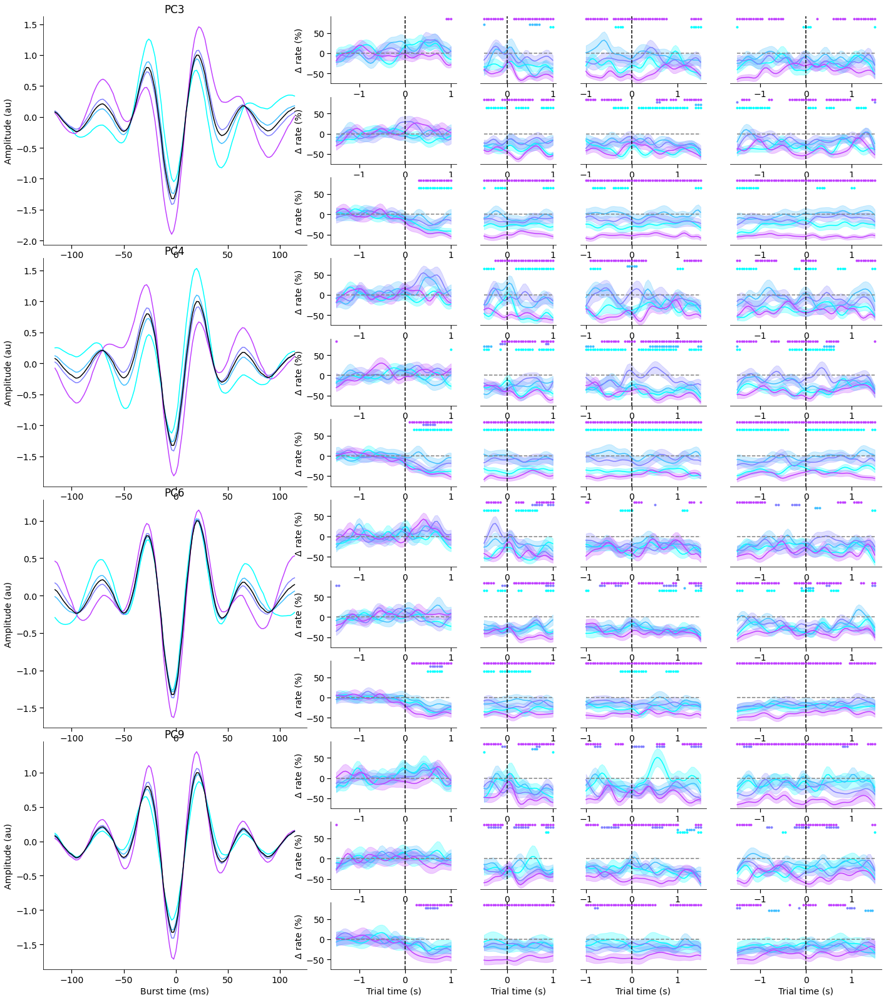

In [21]:
fig=plot_pc_burst_rate(exe_comps, 'exe', 'contra', yl=[-75,65],stats=True)
fig.savefig('/home/bonaiuto/dev_beta_umd/output/figures/figure9.svg', bbox_inches="tight")
fig.savefig('/home/bonaiuto/dev_beta_umd/output/figures/figure9.png', bbox_inches="tight")

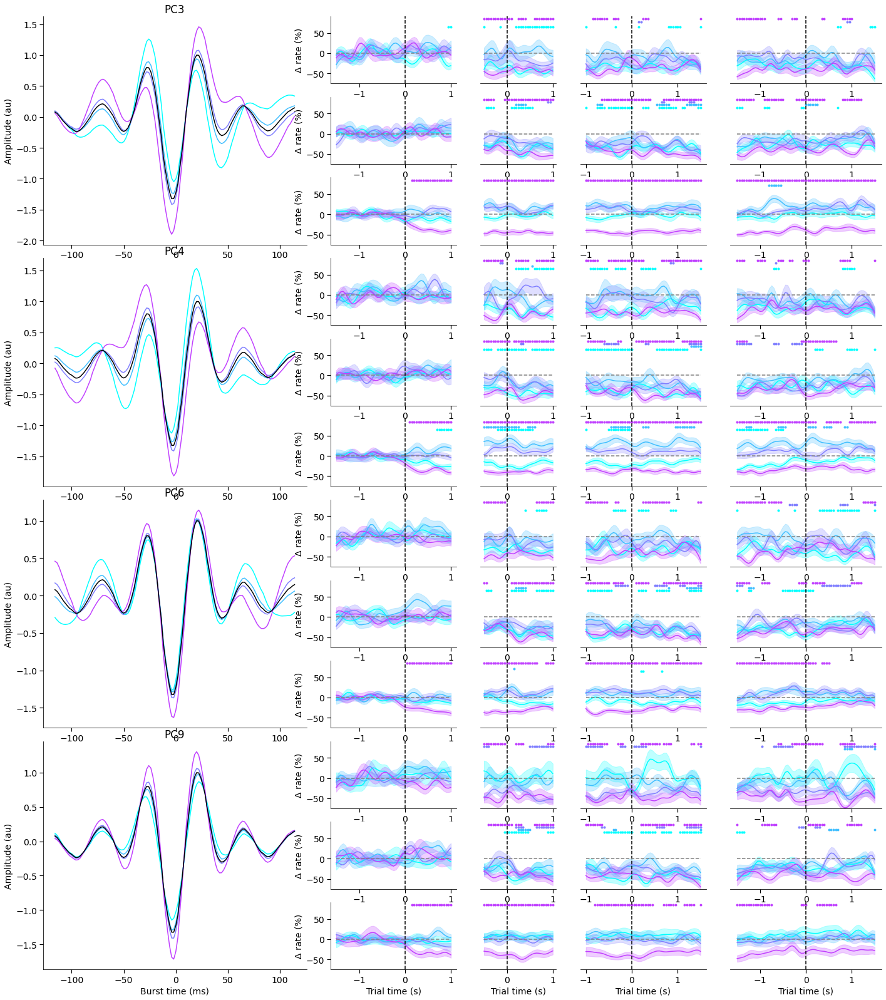

In [22]:
fig=plot_pc_burst_rate(exe_comps, 'exe', 'ipsi', yl=[-75,65],stats=True)
fig.savefig('/home/bonaiuto/dev_beta_umd/output/figures/figure10.svg', bbox_inches="tight")
fig.savefig('/home/bonaiuto/dev_beta_umd/output/figures/figure10.png', bbox_inches="tight")

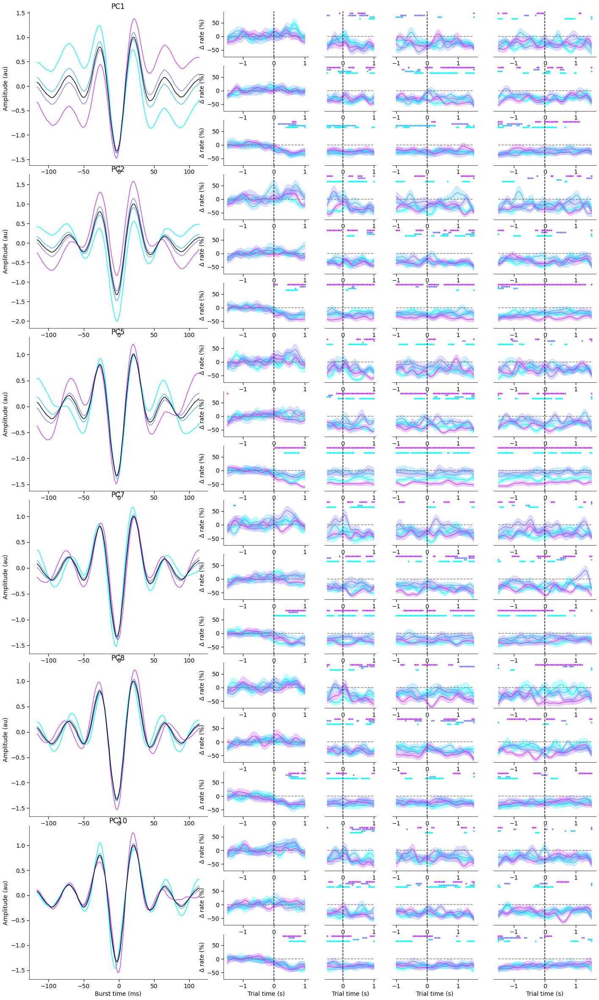

In [23]:
fig=plot_pc_burst_rate(exe_other_comps, 'exe', 'contra', yl=[-75,65], stats=True)

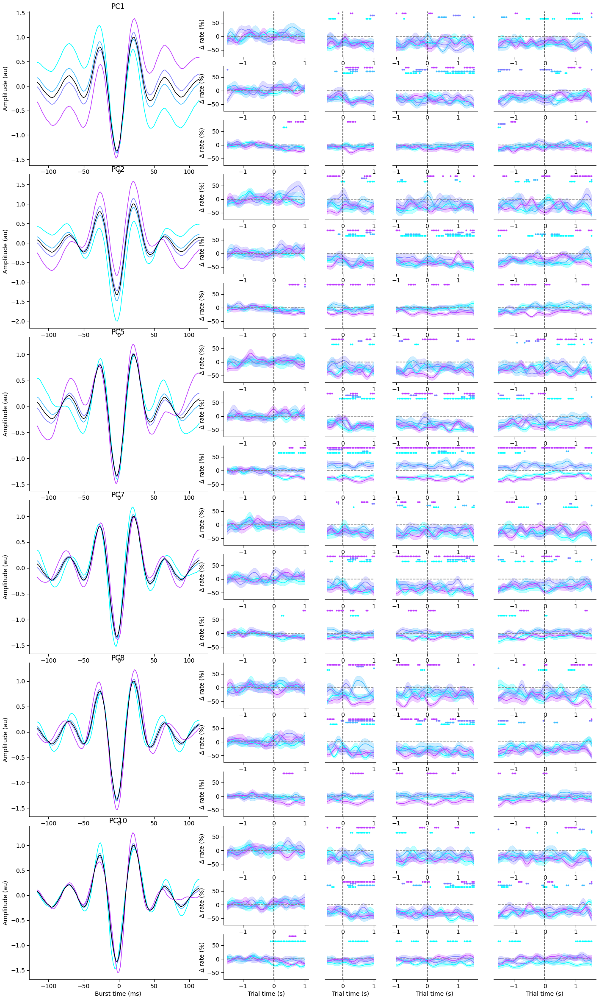

In [24]:
fig=plot_pc_burst_rate(exe_other_comps, 'exe', 'ipsi', yl=[-75,65], stats=True)

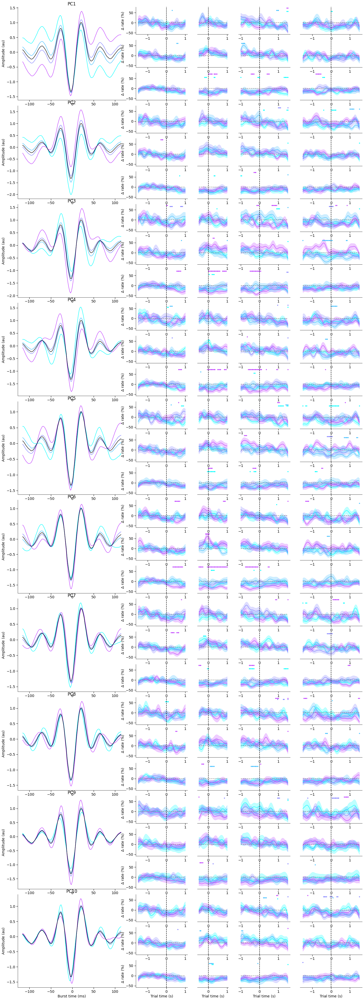

In [25]:
fig=plot_pc_burst_rate(obs_other_comps, 'obs', 'C3', yl=None, stats=True)

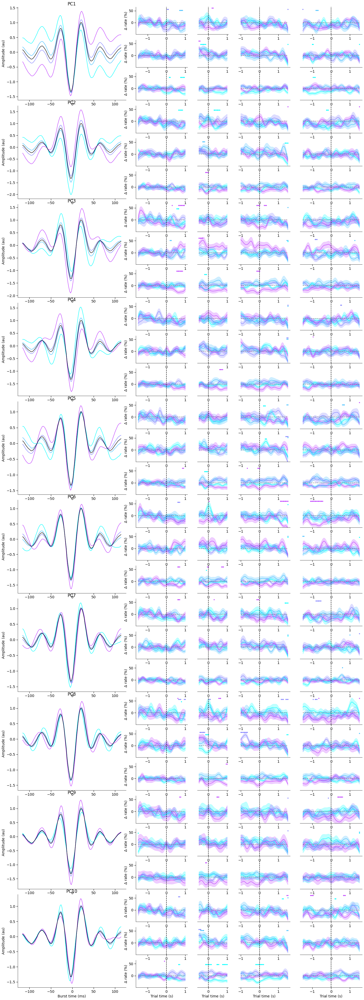

In [26]:
fig=plot_pc_burst_rate(obs_other_comps, 'obs', 'C4', yl=None, stats=True)

In [27]:
def plot_modulated_components(comps, condition, yl=None, stats=True):
    plt.rcParams.update({
        'font.size': 14,
        'axes.spines.right': False,
        'axes.spines.top': False,
        'xtick.major.size': 6,
        'xtick.major.width': 1.2,
        'ytick.major.size': 6,
        'ytick.major.width': 1.2,
        'legend.frameon': False,
        'legend.handletextpad': 0.1,
        'svg.fonttype': 'none',
        'text.usetex': False
    })

    n_comps=len(comps)

    threshold_tfce = dict(start=0, step=0.01)
    sigma = (1e-3)/4
    hat_corr = partial(ttest_1samp_no_p, sigma=sigma)

    cool_colors = plt.cm.cool(np.linspace(0,1,5))        

    aligned_burst_times=c_burst_times_adult[:-1]

    #fig=plt.figure(figsize=(24,6*n_comps))
    fig=plt.figure(figsize=(12,3*n_comps))
    gs = fig.add_gridspec(n_comps,4,width_ratios=[0.17544737, 0.10526842, 0.17544737, 0.21053684])

    for comp_idx,comp in enumerate(comps):
        age_burst_metrics=np.hstack([pca_components_c_9m.iloc[:,comp], 
                                     pca_components_c_12m.iloc[:,comp], 
                                     pca_components_c_adult.iloc[:,comp]])
        subjects=np.unique(all_bursts['subject'])                
        epochs=condition_epochs[condition]

        (epoch_time, c_scores)=compute_scores(condition,
                                              all_bursts, 
                                              age_burst_metrics)
        yls=[]
        epoch_axs=[]
        for e_idx,epoch in enumerate(epochs):        
            ax = fig.add_subplot(gs[comp_idx,e_idx])


            m_score=np.nanmean(c_scores[epoch],axis=0)
            se_score=np.nanstd(c_scores[epoch],axis=0)/np.sqrt(len(subjects))
            ax.fill_between(epoch_time[epoch]/1000,
                            m_score-se_score,
                            m_score+se_score,
                            alpha=.25)
            ax.plot(epoch_time[epoch]/1000,m_score)

            epoch_axs.append(ax)
            yls.append(ax.get_ylim())

        yls=np.array(yls)
        if yl is None:
            yl=[np.min(yls[:,0]),np.max(yls[:,1])]
        for epoch_ax in epoch_axs:
            epoch_ax.set_ylim(yl)

        pos_range=yl[1]
        if stats:
            for e_idx,epoch in enumerate(epochs):        
                m_T_HAT, _, m_P_HAT, _ = permutation_cluster_1samp_test(
                    c_scores[epoch], stat_fun = hat_corr,
                    threshold = threshold_tfce, n_permutations=1000, n_jobs=-1,
                    out_type="mask", verbose=False, adjacency=None, buffer_size=None
                )
                for i in range(len(epoch_time[epoch])):
                    if m_P_HAT[i]<0.05/len(comps):
                        epoch_axs[e_idx].plot(epoch_time[epoch][i]/1000,yl[1]+.05*pos_range, 'b.')

        new_yl=[yl[0], yl[1]+.1*pos_range]            
        for e_idx,epoch in enumerate(epochs):        
            epoch_axs[e_idx].set_ylim(new_yl)
            epoch_axs[e_idx].plot([0,0],new_yl,'k--')
            epoch_axs[e_idx].plot(epoch_time[epoch][[0,-1]]/1000,[0,0],'--',color=[.5,.5,.5])

            if e_idx==0:
                epoch_axs[e_idx].set_ylabel('score')
                epoch_axs[e_idx].tick_params(labelleft=True,left=True)
                epoch_axs[e_idx].spines[['left']].set_visible(True)
            else:
                epoch_axs[e_idx].tick_params(labelleft=False,left=False)
                epoch_axs[e_idx].spines[['left']].set_visible(False)
            epoch_axs[e_idx].set_xlabel('Trial time (s)')      
    return fig

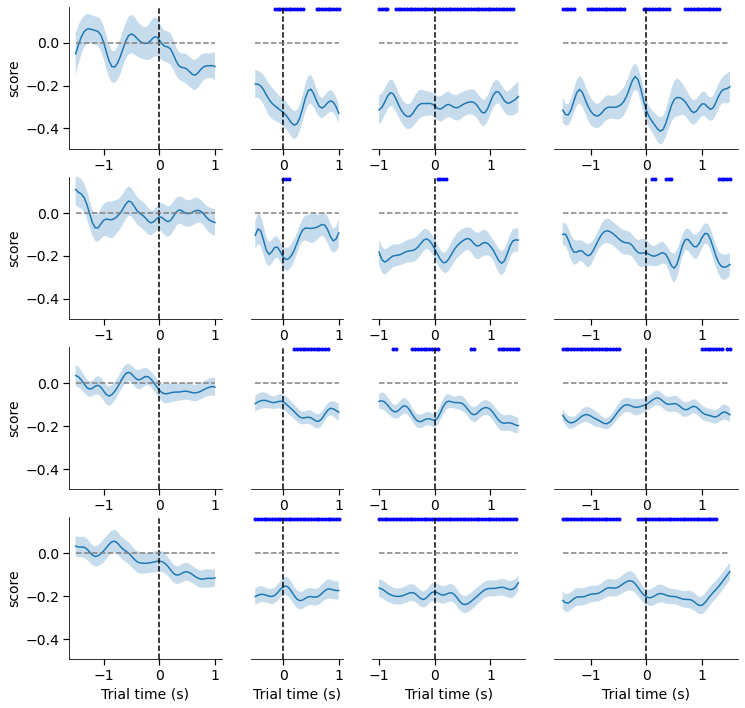

In [28]:
fig=plot_modulated_components(exe_comps,'exe')